## Oriented FAST and Rotated BRIEF (ORB)

### 1. Loading and displaying the images

In [1]:
# Importing the libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [20, 10]

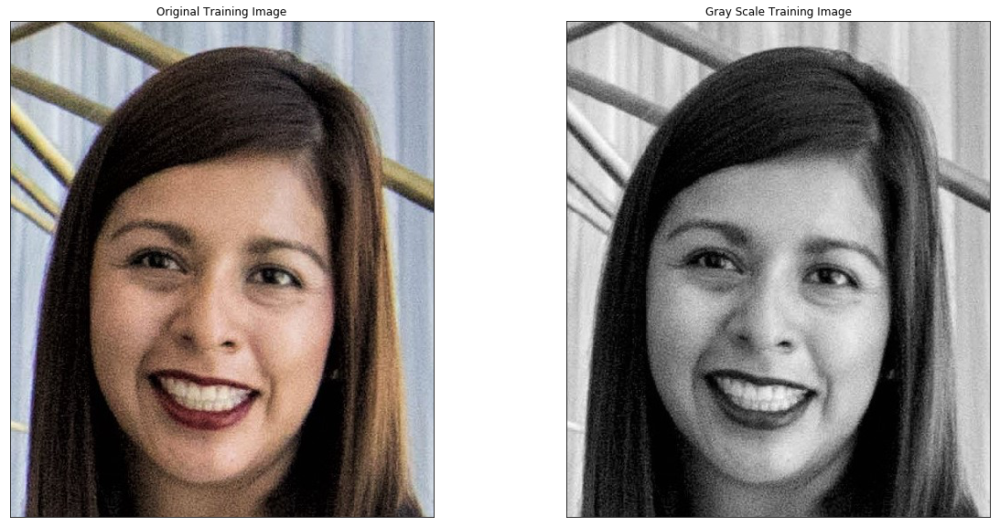

In [14]:
# Loading the image
image = cv2.imread("./images/face.jpeg")

# Converting BGR to RGB
training_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Converting RGB to Gray
training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)

# Visualizing the image
plt.subplot(121)
plt.imshow(training_image)
plt.title("Original Training Image")
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(training_gray, cmap = 'gray')
plt.title("Gray Scale Training Image")
plt.xticks([])
plt.yticks([])

plt.show()

### 2. Keypoints for training image

In [33]:
# Importing the libraries
import copy # For copy image

In [34]:
# set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

In [35]:
# Setting the parameter of ORB
ORB = cv2.ORB_create(nfeatures = 200,          # Maximum number of keypoints
                     scaleFactor = 2.0,        # Pyramid downsampling ratio
                     nlevels = 8,              # Number of levels in pyramid (default)
                     edgeThreshold = 31,       # Size of the border where features are not detected (default)
                     firstLevel = 0,           # The level in which should be threated as first (default)
                     WTA_K = 2,                # Number of random pixels used to produce each element of the oriented BRIEF descriptor. The possible values are 2, 3, and 4 (default)
                     #scoreType = HARRIS_SCORE, # Set to either HARRIS_SCORE or FAST_SCORE. score is used to only retain the best features. (default)
                     patchSize = 31,            # Size of the patch (default)
                     fastThreshold = 20)

In [50]:
# Find the keypoints
keypoints, descriptor = ORB.detectAndCompute(image = training_gray, mask = None)

# Total number of keypoints
print("Total number of (Detected) keypoints: ", len(keypoints))

Total number of keypoints:  175


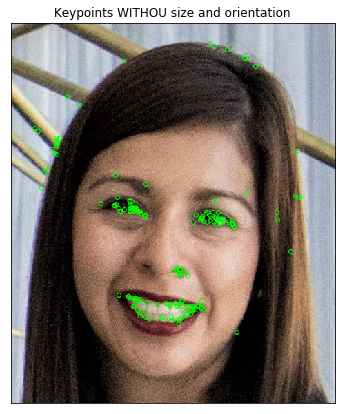

In [51]:
# Draw keypoints without size and orientation

# Making a copy of image
keypoint_without_size = copy.copy(training_image)

# Draw the keypoints
cv2.drawKeypoints(image = training_image,
                  keypoints = keypoints,
                  outImage = keypoint_without_size,
                  color = (0, 255, 0))

# Visualizing the image
plt.imshow(keypoint_without_size)
plt.title("Keypoints WITHOU size and orientation")
plt.xticks([])
plt.yticks([])
plt.show()

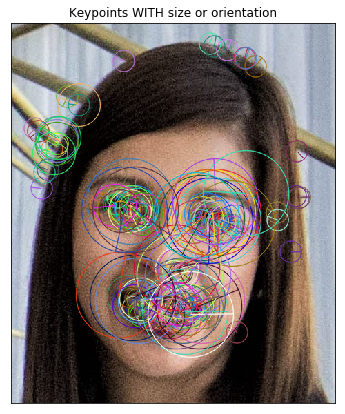

In [52]:
# Draw keypoints with size or orientation

# Making a copy of image
keypoint_with_size = copy.copy(training_image)

# Draw the keypoints
cv2.drawKeypoints(image = training_image, 
                  keypoints = keypoints, 
                  outImage = keypoint_with_size, 
                  flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Visualizing the image
plt.imshow(keypoint_with_size)
plt.title("Keypoints WITH size or orientation")
plt.xticks([])
plt.yticks([])
plt.show()

### 3.1 Feature Matching
Feature matching of two equal images.

In [80]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

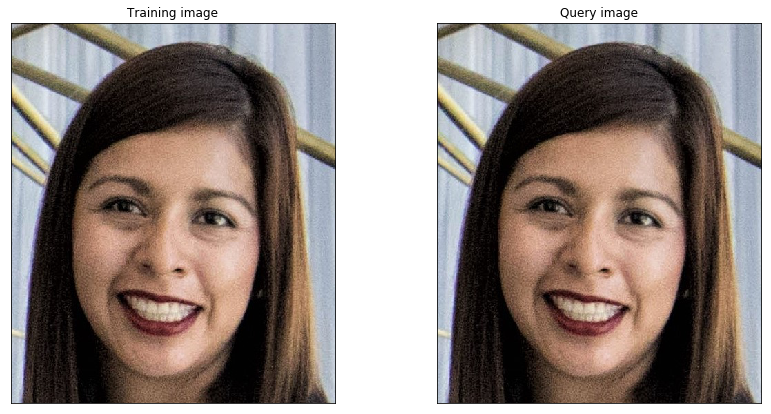

In [86]:
# Loading the image
image1 = cv2.imread("./images/face.jpeg")
image2 = cv2.imread("./images/face.jpeg")

# Converting BGR to RGB in training image 
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Converting BGR to RGB in query image
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Visualizing the the images
f, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(training_image)
ax1.set_title("Training image")
ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)

ax2.imshow(query_image)
ax2.set_title("Query image")
ax2.xaxis.set_visible(False)
ax2.yaxis.set_visible(False)

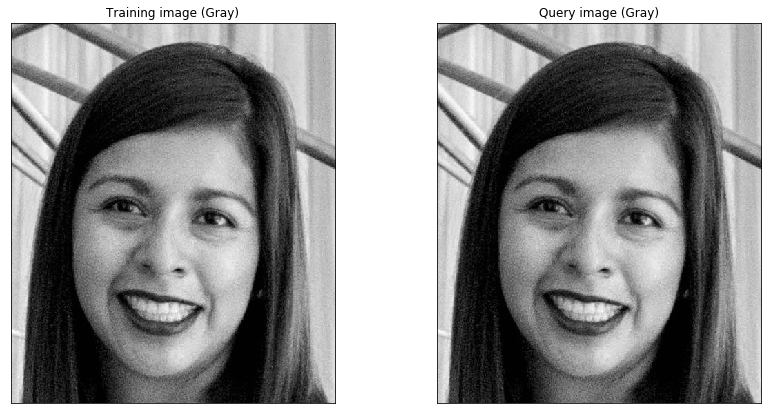

In [89]:
# Converting training image to Grayscale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)

# Converting query image to Grayscale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_RGB2GRAY)

# Visualizing the the images
f, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(training_gray, cmap = 'gray')
ax1.set_title("Training image (Gray)")
ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)

ax2.imshow(query_gray, cmap = 'gray')
ax2.set_title("Query image (Gray)")
ax2.xaxis.set_visible(False)
ax2.yaxis.set_visible(False)

In [91]:
# Setting the paramerets for ORB
ORB = cv2.ORB_create(nfeatures = 1000, scaleFactor = 2.0)

In [110]:
# Finding keypoints and Compuring the ORB descriptor of training image
keypoint_train, descriptors_train = ORB.detectAndCompute(image = training_gray, mask = None)
print("==> Total number of (Detected) keypoints detected in Training Image: ", len(keypoint_train))

# Finding keypoints and Computing the ORB descriptor of query image
keypoint_query, descriptor_query = ORB.detectAndCompute(image = query_gray, mask = None)
print("==> Total number of (Detected) keypoints detected in Query Image: ", len(keypoint_query))

==> Total number of keypoints detected in Training Image:  822
==> Total number of keypoints detected in Query Image:  822


In the above example, since both the training and query images are the exactly the same, we expect that the same number of keypoints are found in both images, and that all the keypoints match. 

In [94]:
# Create Brute Force matcher
BF = cv2.BFMatcher(normType = cv2.NORM_HAMMING, # Metric determining quality of the match. use "normType = cv2.NORM_L2" for non-binary. "cv2.NORM_HAMMING" for binary. these are true if "WTA_K = 2". in case of "WTA_K = 3", use "cv2.NORM_HAMMING2"
                   crossCheck = True) # If true a match is considered only if keypoint A in the training image is the best match of keypoint B in the query image and vice-versa but if it's false then there is no vice versa

In [109]:
# Perform matching between 2 descriptors
matches = BF.match(descriptors_train, descriptor_query)

# Sorting the distance since the matches with shorter distance is what we want
matches = sorted(matches, key = lambda x: x.distance)

print("==> Total number of matching points between the Training Image and Query Image: ", len(matches))

==> Total number of matching points between the Training Image and Query Image:  822


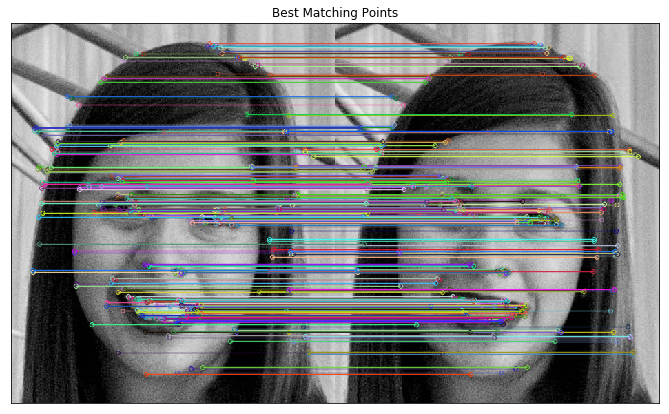

In [114]:
# Getting the best matches which has shorter distance
best_matches = matches[:300]

# Connect keypoints between training and query image
result = cv2.drawMatches(img1 = training_gray, 
                         keypoints1 = keypoint_train, 
                         img2 = query_gray,
                         keypoints2 = keypoint_query, 
                         matches1to2 = best_matches, 
                         outImg = query_gray, 
                         flags = 2) # flags = 2 to plot the matching keypoints without size or orientation.

# Visualizing the best matching points
plt.imshow(result)
plt.title("Best Matching Points")
plt.xticks([])
plt.yticks([])
plt.show()

### 3.2 Feature Matching
Feature matching of two diffrent size images for showing algorithm's **Scale Invariance**.

Shape of Training Image: (553, 471)
Shape of Query Image: (138, 117)
==> Total number of keypoints detected in Training Image:  821
==> Total number of keypoints detected in Query Image:  65
==> Total number of matching points between the Training Image and Query Image:  60


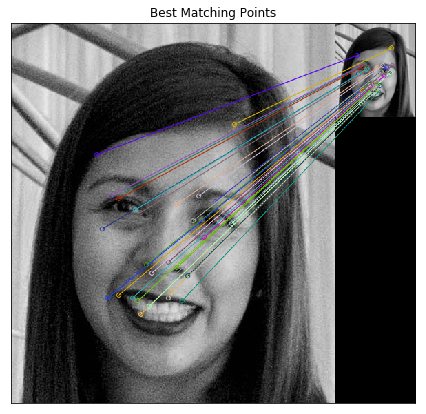

In [120]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Loading the image
image1 = cv2.imread("./images/face.jpeg")
image2 = cv2.imread("./images/faceQS.png")

# Converting BGR to RGB in training image 
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
print('Shape of Training Image:', training_gray.shape)

# Converting BGR to RGB in query image
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
print('Shape of Query Image:', query_gray.shape)

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Setting the paramerets for ORB
ORB = cv2.ORB_create(nfeatures = 1000, scaleFactor = 2.0)

# Finding keypoints and Compuring the ORB descriptor of training image
keypoint_train, descriptors_train = ORB.detectAndCompute(image = training_gray, mask = None)
print("==> Total number of (Detected) keypoints detected in Training Image: ", len(keypoint_train))

# Finding keypoints and Computing the ORB descriptor of query image
keypoint_query, descriptor_query = ORB.detectAndCompute(image = query_gray, mask = None)
print("==> Total number of (Detected) keypoints detected in Query Image: ", len(keypoint_query))

# Create Brute Force matcher
BF = cv2.BFMatcher(normType = cv2.NORM_HAMMING, 
                   crossCheck = True) 

# Perform matching between 2 descriptors
matches = BF.match(descriptors_train, descriptor_query)

# Sorting the distance since the matches with shorter distance is what we want
matches = sorted(matches, key = lambda x: x.distance)

print("==> Total number of matching points between the Training Image and Query Image: ", len(matches))

# Getting the best matches which has shorter distance
best_matches = matches[:30]

# Connect keypoints between training and query image
result = cv2.drawMatches(img1 = training_gray, 
                         keypoints1 = keypoint_train, 
                         img2 = query_gray,
                         keypoints2 = keypoint_query, 
                         matches1to2 = best_matches, 
                         outImg = query_gray, 
                         flags = 2) # flags = 2 to plot the matching keypoints without size or orientation.

# Visualizing the best matching points
plt.imshow(result)
plt.title("Best Matching Points")
plt.xticks([])
plt.yticks([])
plt.show()

### 3.3 Feature Matching
Feature matching of two diffrent rotated images for showing algorithm's **Rotational Invariance**.

==> Total number of keypoints detected in Training Image:  821
==> Total number of keypoints detected in Query Image:  836
==> Total number of matching points between the Training Image and Query Image:  645


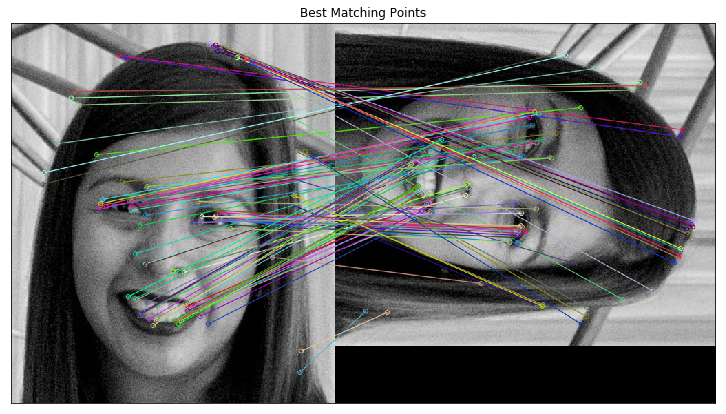

In [123]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Loading the image
image1 = cv2.imread("./images/face.jpeg")
image2 = cv2.imread("./images/faceR.jpeg")

# Converting BGR to RGB in training image 
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Converting BGR to RGB in query image
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Setting the paramerets for ORB
ORB = cv2.ORB_create(nfeatures = 1000, scaleFactor = 2.0)

# Finding keypoints and Compuring the ORB descriptor of training image
keypoint_train, descriptors_train = ORB.detectAndCompute(image = training_gray, mask = None)
print("==> Total number of (Detected) keypoints in Training Image: ", len(keypoint_train))

# Finding keypoints and Computing the ORB descriptor of query image
keypoint_query, descriptor_query = ORB.detectAndCompute(image = query_gray, mask = None)
print("==> Total number of (Detected) keypoints in Query Image: ", len(keypoint_query))

# Create Brute Force matcher
BF = cv2.BFMatcher(normType = cv2.NORM_HAMMING, 
                   crossCheck = True) 

# Perform matching between 2 descriptors
matches = BF.match(descriptors_train, descriptor_query)

# Sorting the distance since the matches with shorter distance is what we want
matches = sorted(matches, key = lambda x: x.distance)

print("==> Total number of matching points between the Training Image and Query Image: ", len(matches))

# Getting the best matches which has shorter distance
best_matches = matches[:100]

# Connect keypoints between training and query image
result = cv2.drawMatches(img1 = training_gray, 
                         keypoints1 = keypoint_train, 
                         img2 = query_gray,
                         keypoints2 = keypoint_query, 
                         matches1to2 = best_matches, 
                         outImg = query_gray, 
                         flags = 2) # flags = 2 to plot the matching keypoints without size or orientation.

# Visualizing the best matching points
plt.imshow(result)
plt.title("Best Matching Points")
plt.xticks([])
plt.yticks([])
plt.show()

### 3.4 Feature Matching
Feature matching of two images with diffrent illumination for showing algorithm's **Illumination Invariance**.

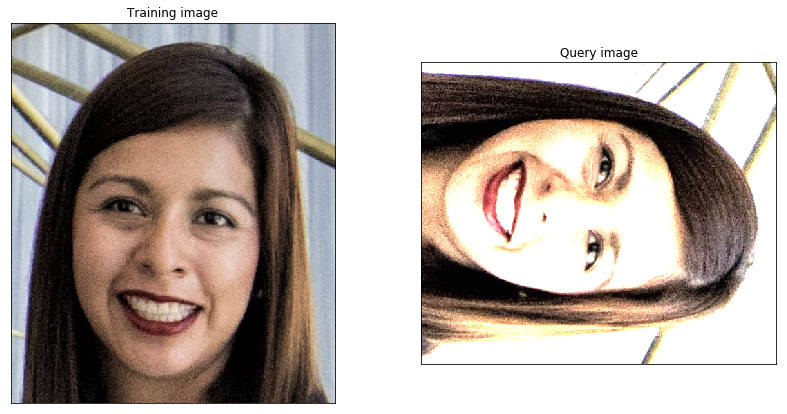

==> Total number of keypoints detected in Training Image:  821
==> Total number of keypoints detected in Query Image:  846
==> Total number of matching points between the Training Image and Query Image:  505


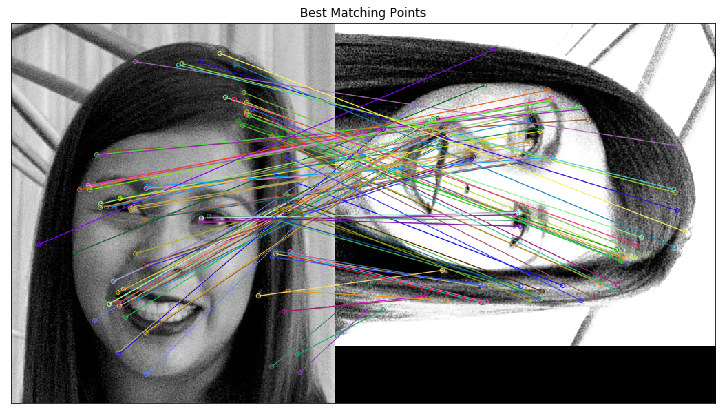

In [135]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Loading the image
image1 = cv2.imread("./images/face.jpeg")
image2 = cv2.imread('./images/faceRI.png')

# Converting BGR to RGB in training image 
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Converting BGR to RGB in query image
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Visualizing the the images
f, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(training_image)
ax1.set_title("Training image")
ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)

ax2.imshow(query_image)
ax2.set_title("Query image")
ax2.xaxis.set_visible(False)
ax2.yaxis.set_visible(False)

plt.show()

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Setting the paramerets for ORB
ORB = cv2.ORB_create(nfeatures = 1000, scaleFactor = 2.0)

# Finding keypoints and Compuring the ORB descriptor of training image
keypoint_train, descriptors_train = ORB.detectAndCompute(image = training_gray, mask = None)
print("==> Total number of (Detected) keypoints in Training Image: ", len(keypoint_train))

# Finding keypoints and Computing the ORB descriptor of query image
keypoint_query, descriptor_query = ORB.detectAndCompute(image = query_gray, mask = None)
print("==> Total number of (Detected) keypoints in Query Image: ", len(keypoint_query))

# Create Brute Force matcher
BF = cv2.BFMatcher(normType = cv2.NORM_HAMMING, 
                   crossCheck = True) 

# Perform matching between 2 descriptors
matches = BF.match(descriptors_train, descriptor_query)

# Sorting the distance since the matches with shorter distance is what we want
matches = sorted(matches, key = lambda x: x.distance)

print("==> Total number of matching points between the Training Image and Query Image: ", len(matches))

# Getting the best matches which has shorter distance
best_matches = matches[:100]

# Connect keypoints between training and query image
result = cv2.drawMatches(img1 = training_gray, 
                         keypoints1 = keypoint_train, 
                         img2 = query_gray,
                         keypoints2 = keypoint_query, 
                         matches1to2 = best_matches, 
                         outImg = query_gray, 
                         flags = 2) # flags = 2 to plot the matching keypoints without size or orientation.

# Visualizing the best matching points
plt.imshow(result)
plt.title("Best Matching Points")
plt.xticks([])
plt.yticks([])
plt.show()

### 3.5 Feature Matching

Feature matching of two images with one image having noise. this is for showing algorithm's **Noise Invariance**.

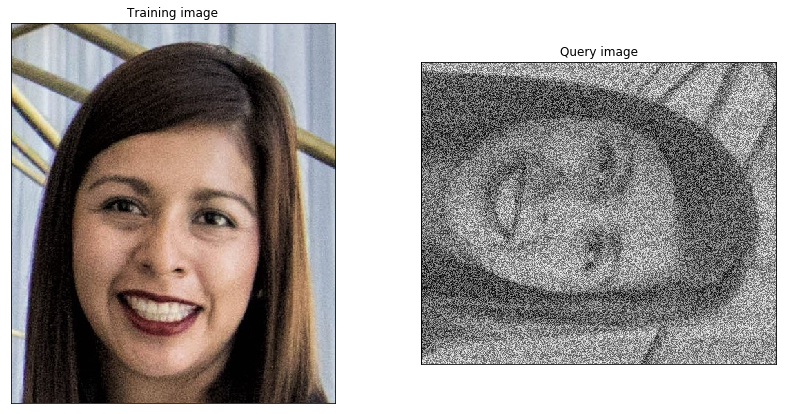

==> Total number of keypoints detected in Training Image:  883
==> Total number of keypoints detected in Query Image:  926
==> Total number of matching points between the Training Image and Query Image:  538


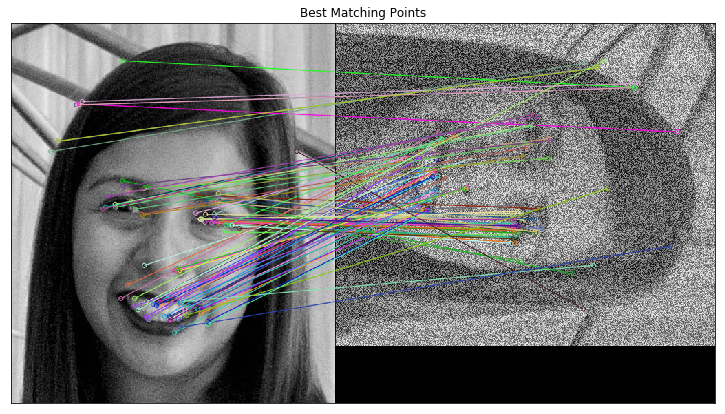

In [137]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Loading the image
image1 = cv2.imread("./images/face.jpeg")
image2 = cv2.imread('./images/faceRN5.png')

# Converting BGR to RGB in training image 
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Converting BGR to RGB in query image
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Visualizing the the images
f, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(training_image)
ax1.set_title("Training image")
ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)

ax2.imshow(query_image)
ax2.set_title("Query image")
ax2.xaxis.set_visible(False)
ax2.yaxis.set_visible(False)

plt.show()

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Setting the paramerets for ORB
ORB = cv2.ORB_create(nfeatures = 1000, scaleFactor = 1.3)

# Finding keypoints and Compuring the ORB descriptor of training image
keypoint_train, descriptors_train = ORB.detectAndCompute(image = training_gray, mask = None)
print("==> Total number of (Detected) keypoints in Training Image: ", len(keypoint_train))

# Finding keypoints and Computing the ORB descriptor of query image
keypoint_query, descriptor_query = ORB.detectAndCompute(image = query_gray, mask = None)
print("==> Total number of (Detected) keypoints in Query Image: ", len(keypoint_query))

# Create Brute Force matcher
BF = cv2.BFMatcher(normType = cv2.NORM_HAMMING, 
                   crossCheck = True) 

# Perform matching between 2 descriptors
matches = BF.match(descriptors_train, descriptor_query)

# Sorting the distance since the matches with shorter distance is what we want
matches = sorted(matches, key = lambda x: x.distance)

print("==> Total number of matching points between the Training Image and Query Image: ", len(matches))

# Getting the best matches which has shorter distance
best_matches = matches[:100]

# Connect keypoints between training and query image
result = cv2.drawMatches(img1 = training_gray, 
                         keypoints1 = keypoint_train, 
                         img2 = query_gray,
                         keypoints2 = keypoint_query, 
                         matches1to2 = best_matches, 
                         outImg = query_gray, 
                         flags = 2) # flags = 2 to plot the matching keypoints without size or orientation.

# Visualizing the best matching points
plt.imshow(result)
plt.title("Best Matching Points")
plt.xticks([])
plt.yticks([])
plt.show()

### Object Detection

In [138]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

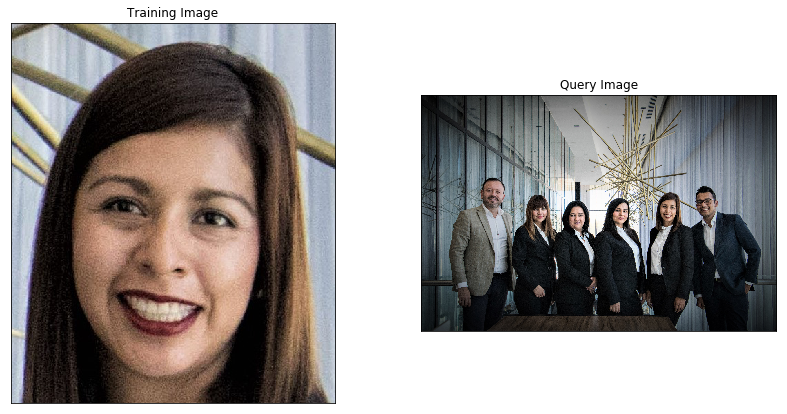

In [140]:
# Loading the images
image1 = cv2.imread("./images/face.jpeg")
image2 = cv2.imread("./images/Team.jpeg")

# Converting BGR to RGB for training image
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Visualizing the images
plt.subplot(121)
plt.imshow(training_image)
plt.title("Training Image")
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(query_image)
plt.title("Query Image")
plt.xticks([])
plt.yticks([])

plt.show()

##### Keypoints for query image

In [142]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [34.0, 34.0]

In [143]:
# Converting the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)

# Converting the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_RGB2GRAY)

In [145]:
# Setting the parameters for ORB
ORB = cv2.ORB_create(nfeatures = 5000, scaleFactor = 2.0)

In [155]:
# Finding the keypoints and getting the ORB descriptor
keypoint_training, descriptor_training = ORB.detectAndCompute(image = training_gray, mask = None)
print("==> Total number of (Detected) keypoint in training image: ", len(keypoint_training))

keypoint_query, descriptor_query = ORB.detectAndCompute(image = query_gray, mask = None)
print("==> Total number of (Detected) keypoint in query image: ", len(keypoint_query))

==> Total number of (Detected) keypoint in training image:  2501
==> Total number of (Detected) keypoint in query image:  4941


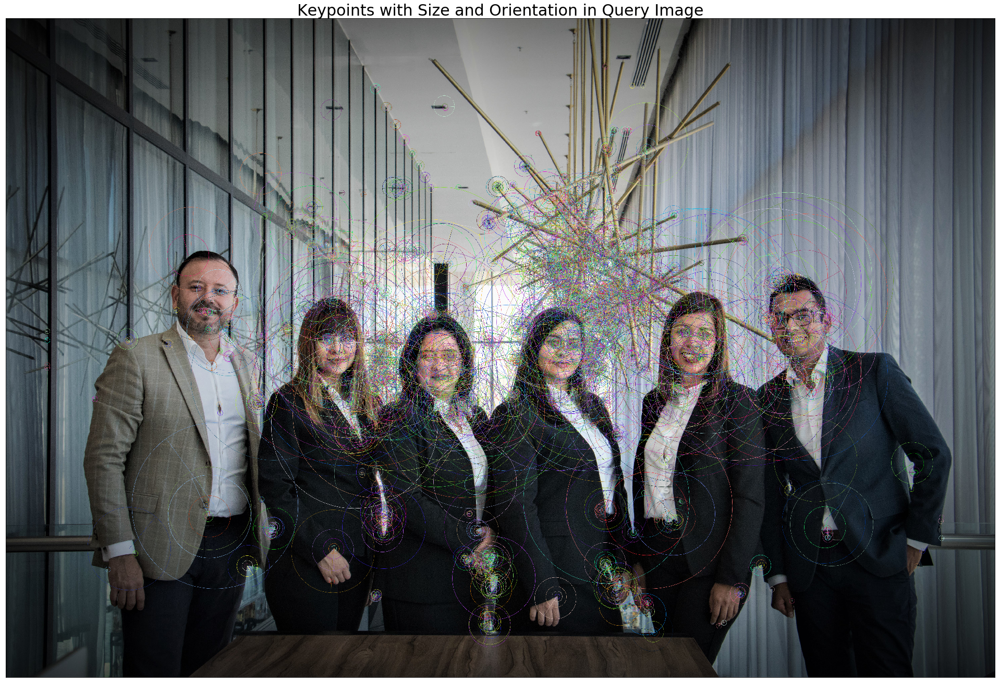

In [152]:
# Making a copy of query image
query_image_copy = copy.copy(query_image)

# Draw the keypoints with size and orientation
cv2.drawKeypoints(image = query_image, 
                  keypoints = keypoint_query, 
                  outImage = query_image_copy, 
                  flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Visualizing the image
plt.imshow(query_image_copy)
plt.title("Keypoints with Size and Orientation in Query Image", fontsize = 30)
plt.xticks([])
plt.yticks([])
plt.show()

##### Feature Matching

In [156]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [34., 34.]

In [157]:
# Creating a Brute Force matches
BF = cv2.BFMatcher(normType = cv2.HAMMING_NORM_TYPE, 
                   crossCheck = True)

In [167]:
# Perform matching of two ORB descriptors
matches = BF.match(descriptor_training, descriptor_query)

# Sorting the matches
matches = sorted(matches, key = lambda x: x.distance)

print("==> Number of matching points between training image and query image: ", len(matches))

==> Number of matching points between training image and query image:  1573


In [162]:
# Getting the best matches which has shorter distance
best_matches = matches[:85]

# Drawing the matches
result = cv2.drawMatches(img1 = training_gray, 
                         keypoints1 = keypoint_training,
                         img2 = query_gray,
                         keypoints2 = keypoint_query,
                         matches1to2 = best_matches,
                         outImg = query_gray,
                         flags = 2)

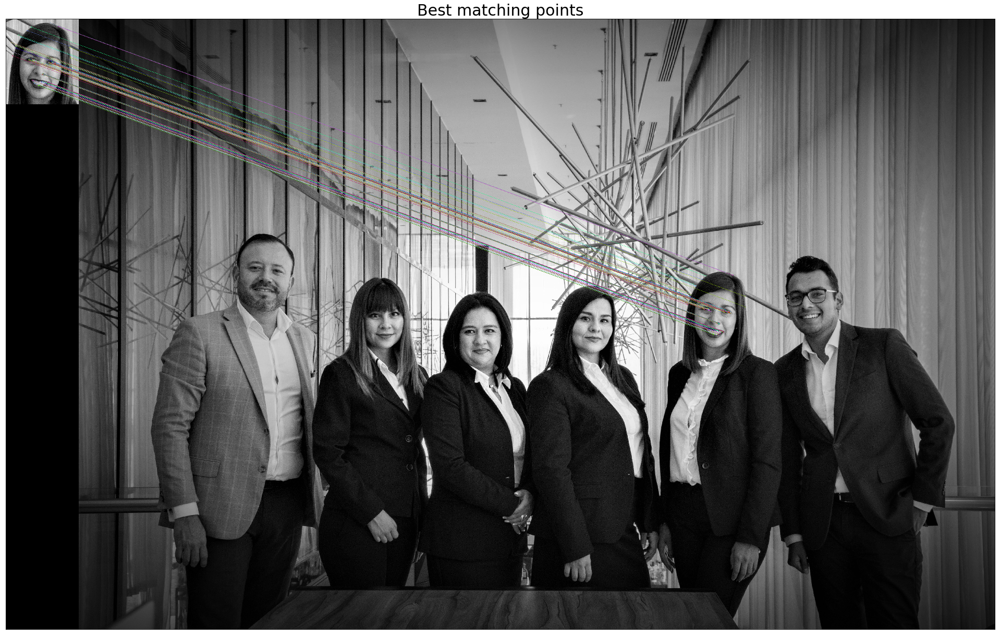

In [166]:
# Visualizing the images
plt.imshow(result)
plt.title("Best matching points", fontsize = 30)
plt.xticks([])
plt.yticks([])
plt.show()